# Find markers for less confidently annotated region (correlation-based & ICI annotation) using escoring 

#### Note that we are in Python

#### Working directory must contain subdirectories,supp_data

#### supp_data/ should contain the files, which are available on Github (github.com/Hsu-Che-Wei/COPILOT):

    hvg_integrated.h5 (get it by running through notebook 3-1)  
    hvg_ids.txt (get it by running through notebook 3-2)
    umap50.txt (get it by running through notebook 3-2)
    umap.txt (get it by running through notebook 3-2)
    selected.cells.txt

### 1. Import all needed functions

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy.sparse import csr_matrix
from escoring.enrichment_scoring import calculate_escores
from escoring.enrichment_scoring import permute, sig_interval
from escoring.support_funcs import load_sparse_h5, pairwise_similarities
from escoring.support_funcs import sig_dictionary

### 2. Load the data

#### Expression matrix

In [2]:
# This is the integrated (batch-corrected) expression matrix from atlas
HVG = load_sparse_h5("counts","./supp_data/hvg_integrated.h5")

In [3]:
type(HVG)

scipy.sparse.csr.csr_matrix

In [4]:
# Escoring accepts matrices where rows are cells and columns are genes. So one will need to transpose the matrix if the matrix is gene-by-cell
HVG = HVG.T

In [5]:
HVG.shape

(110427, 17513)

In [8]:
fname = "./supp_data/hvg_ids.txt"
with open(fname, "r") as f:
    hvg_names = [gene.strip("\n") for gene in f.readlines()]
f.close()

#### Reference cells

In [17]:
# Ramdomly select cells in region that is not confidently annotated by correlation-based and ici method.
fname = "./supp_data/selected.cells.txt"
with open(fname, "r") as f:
    r_cells = [int(cell.strip("\n")) for cell in f.readlines()]
f.close()

#### 50 UMAP dimensions for similarity calculations

In [20]:
UMAP_50 = np.loadtxt("./supp_data/umap50.txt")  # or load your preferred representation

#### 2D UMAP for visualization

In [21]:
UMAP = np.loadtxt("./supp_data/umap.txt")

### 3. Enrichment scoring

In [22]:
# RBF kernel is chosen
metric = "rbf"  
gamma = 0.8  # only use if laplacian, sigmoid or rbf and replace by wished value
S = pairwise_similarities(UMAP_50, r_cells, metric=metric,
                          metric_params={"gamma": gamma}  # only use if needed
                         )

In [23]:
S.shape

(110427, 30)

In [24]:
# Calculate the enrichment scores
escores = calculate_escores(HVG, r_cells, S=S, optim_over="cols", scale_exp=False)

Start enrichment scoring using 160 CPUs
Creating process pool
Run enrichment scoring
Enrichment scoring complete


The escores dataframe is a dataframe of size genes x r_cells. The order of genes is preserved, so you can map them back to the indices of the genes in the original data. Take care here that in Python, counting starts at 0 and not 1. If you need any help here, let me know. Below, I manually set the gene names to the index.

In [25]:
escores.index = hvg_names

In [26]:
escores.index

Index(['AT1G05260', 'AT3G59370', 'AT2G36100', 'AT1G12080', 'AT1G12090',
       'AT4G11290', 'AT5G42180', 'AT5G66390', 'AT2G32300', 'AT2G02130',
       ...
       'AT4G06395', 'AT3G55440', 'AT3G03100', 'AT5G54760', 'AT2G33040',
       'AT2G42680', 'AT5G11770', 'AT5G08290', 'AT5G53300', 'AT5G64400'],
      dtype='object', length=17513)

In [27]:
# Permute the dataframe. This takes a little while.
n = 100  # how many times to permute the dataframe
seed = 42  # set this for reproducibility
P = permute(HVG, n=n, seed=seed)

In [28]:
pscores = calculate_escores(P, r_cells, S=S, optim_over="cols", scale_exp=False)

Start enrichment scoring using 160 CPUs
Creating process pool
Run enrichment scoring
Enrichment scoring complete


In [30]:
# Determine the significance cut-offs
n_sds = 5  # the number of SDs away from the mean for significance
cutoffs = sig_interval(pscores, n_sds=n_sds)

In [31]:
type(escores)

pandas.core.frame.DataFrame

In [32]:
# Get a dictionary of significant genes per cell
sigs = sig_dictionary(escores, cutoffs)

In [33]:
sigs

{1958: ['AT5G62330',
  'AT1G54890',
  'AT3G60530',
  'AT1G57590',
  'AT5G51500',
  'AT5G06270',
  'AT1G26945',
  'AT1G53130',
  'AT3G20360',
  'AT1G68150',
  'AT3G62280',
  'AT2G20800',
  'AT1G06930',
  'AT3G09455',
  'AT5G51490',
  'AT2G04090',
  'AT1G02440',
  'AT3G54410',
  'AT4G22235',
  'AT3G27950',
  'AT3G60440',
  'AT2G37260',
  'AT1G48470',
  'AT4G27950',
  'AT4G12170',
  'AT2G09005',
  'AT1G74810',
  'AT1G67400',
  'AT3G25905',
  'AT2G23672',
  'AT3G49110',
  'AT1G06773',
  'AT1G68470'],
 19425: ['AT3G02230',
  'AT5G25830',
  'AT4G00480',
  'AT5G44820',
  'AT5G25190',
  'AT3G62120',
  'AT3G61270',
  'AT5G04820',
  'AT3G17780',
  'AT5G14150',
  'AT1G07645',
  'AT1G09580',
  'AT1G47640',
  'AT1G60787',
  'AT3G52760',
  'AT3G07680',
  'AT1G13510',
  'AT5G60370',
  'AT2G34920',
  'AT4G17010',
  'AT4G21720',
  'AT2G23310',
  'AT3G58860',
  'AT2G45070',
  'AT4G03490',
  'AT3G03555',
  'AT3G03290',
  'AT3G03160',
  'AT5G10780',
  'AT2G29120',
  'AT1G33100',
  'AT1G55440'],
 51665: ['

In [35]:
# Save the output
df = pd.DataFrame({key: pd.Series(value) for key, value in sigs.items()})
df.to_csv("./supp_data/escoring.gene.nsds5.csv", encoding='utf-8', index=False)

In [36]:
# Save the output
escores.to_csv("./supp_data/escoring.gene.csv", encoding='utf-8', index=False)

### 4. Visualize the top 3 most enriched genes for each reference cell

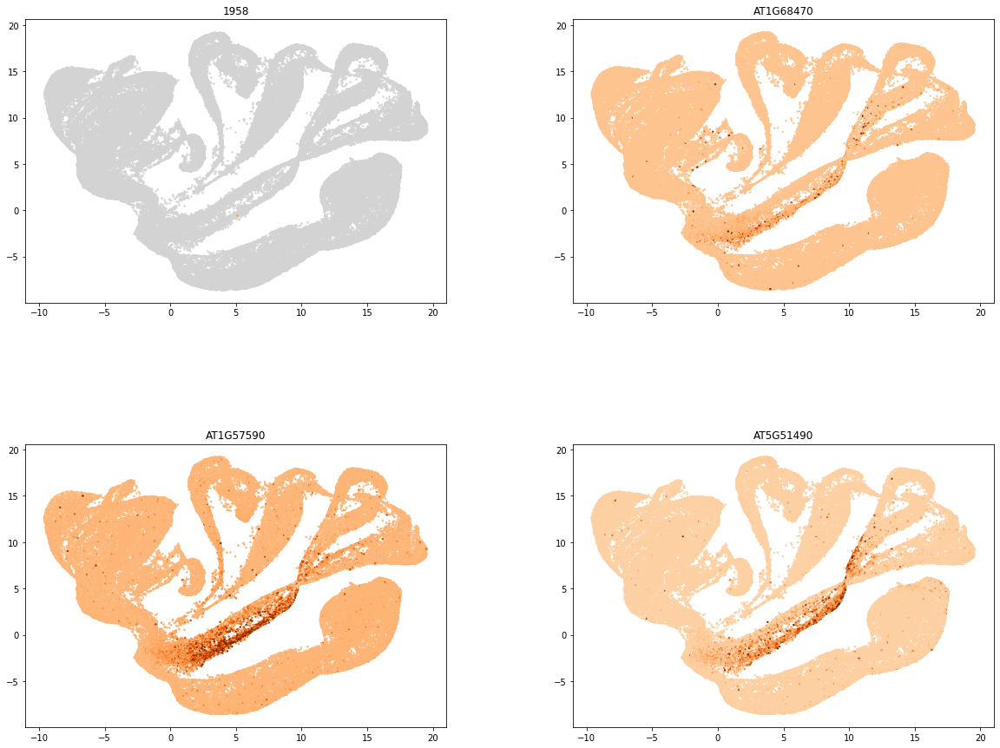

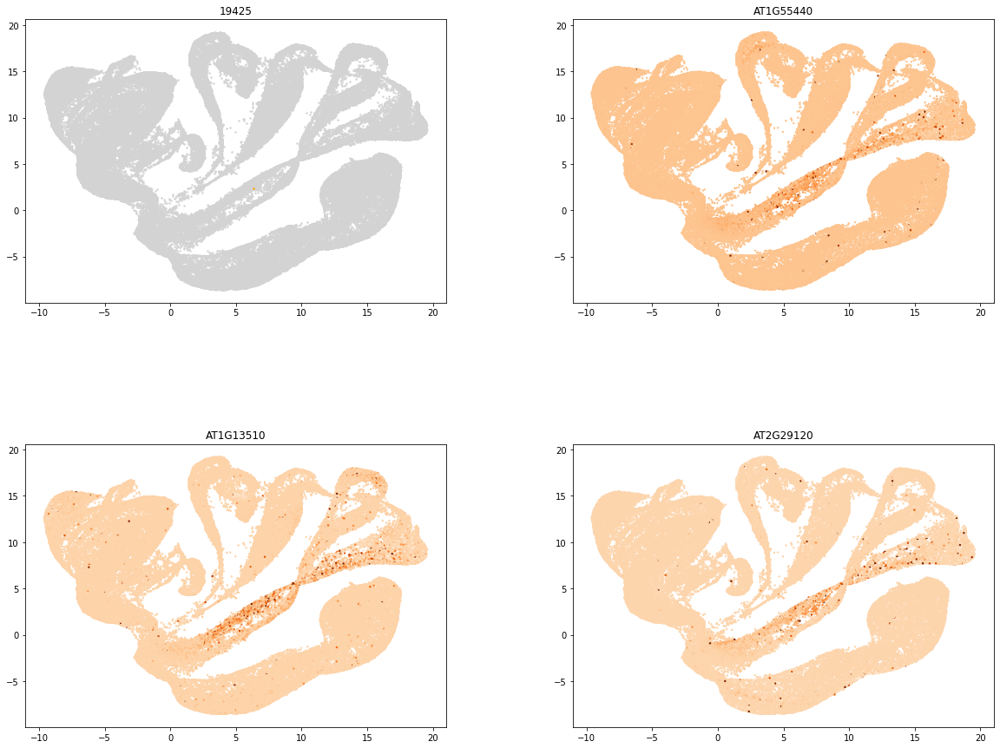

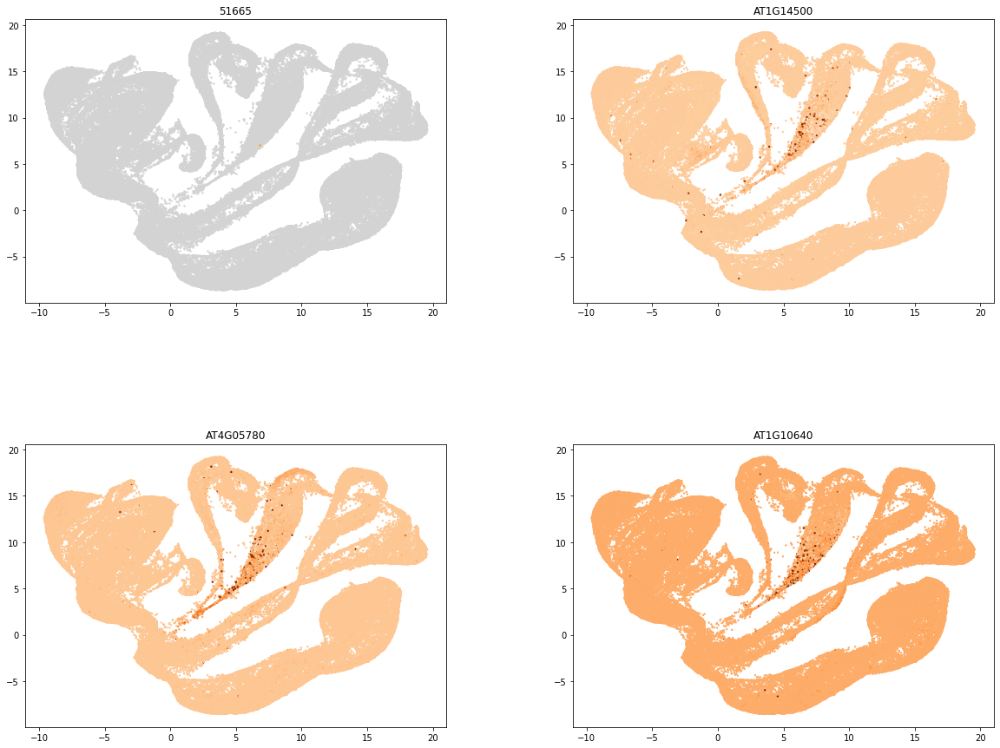

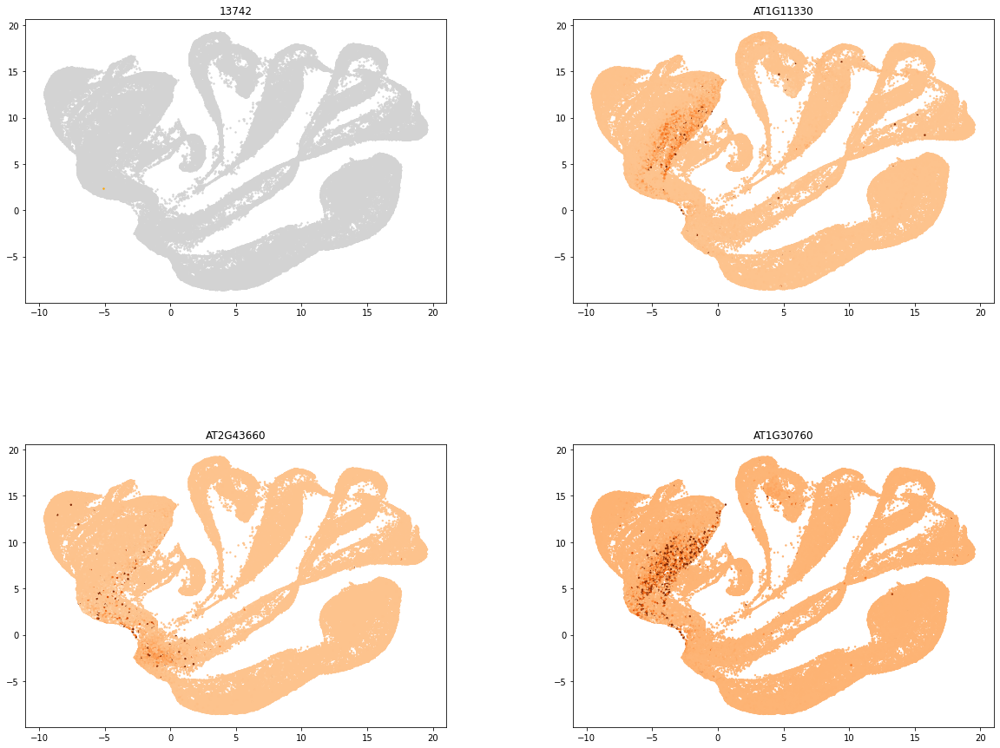

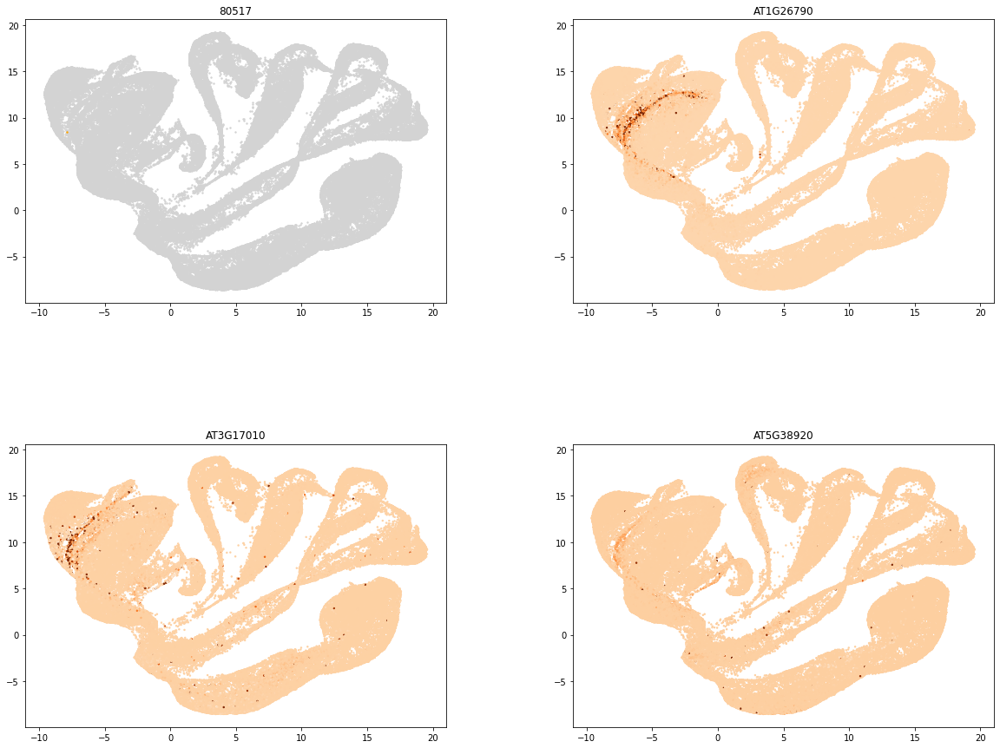

...

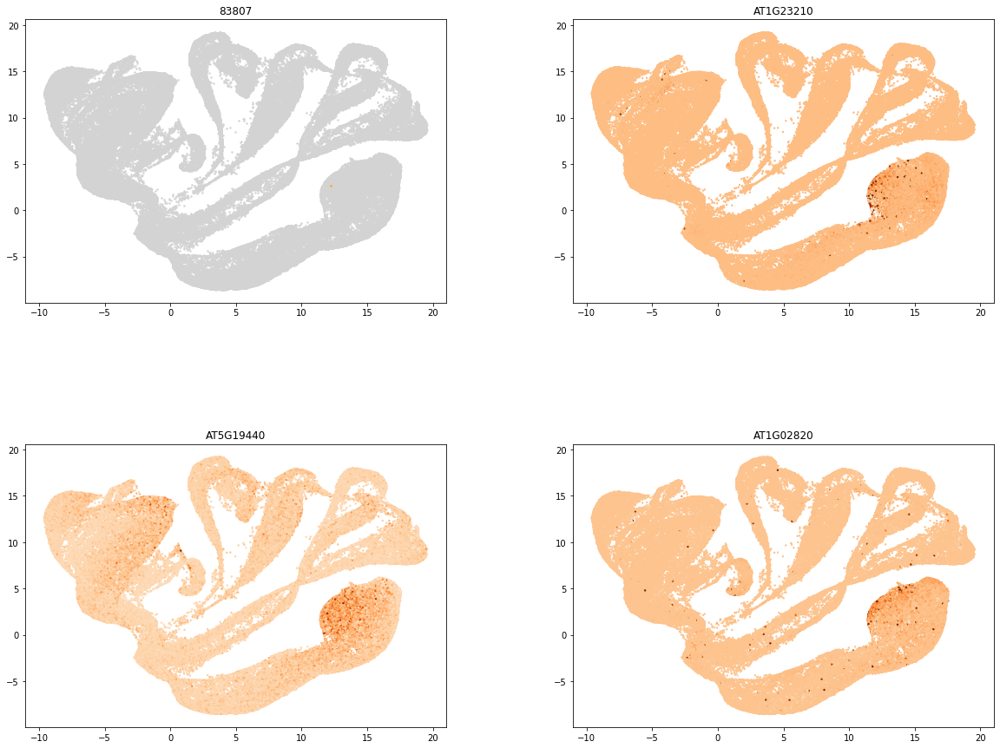

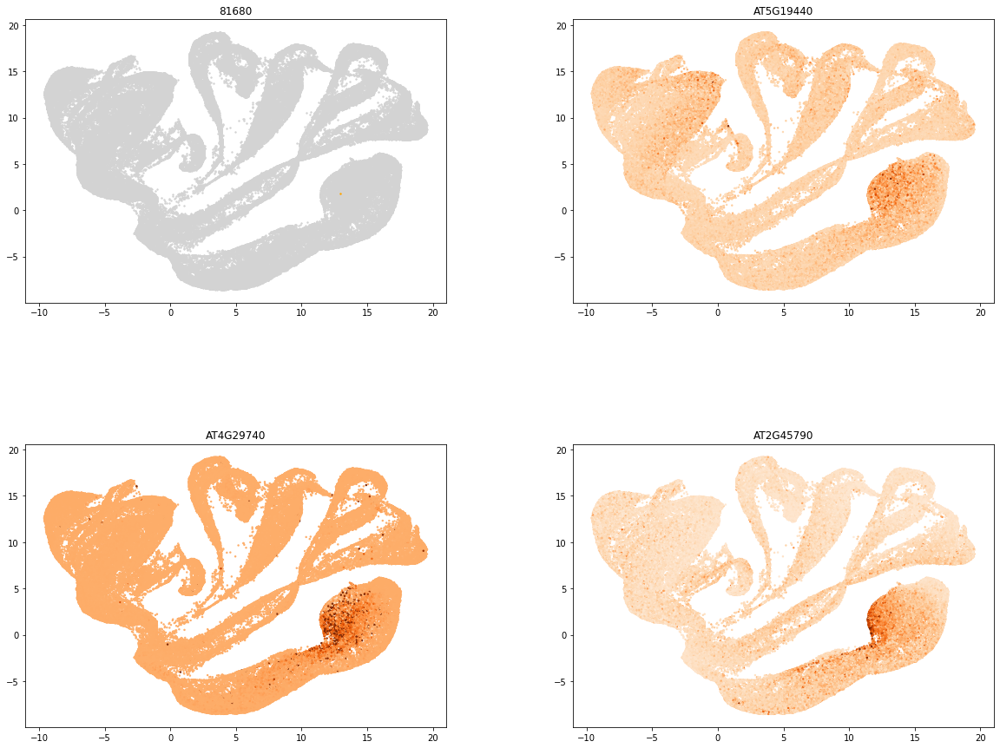

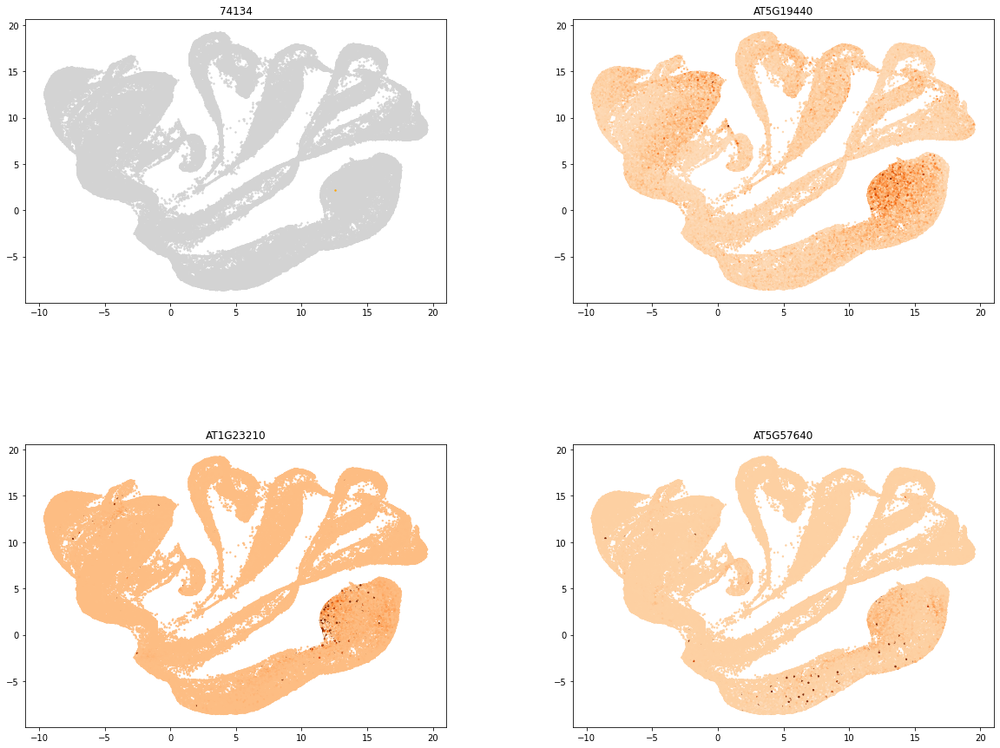

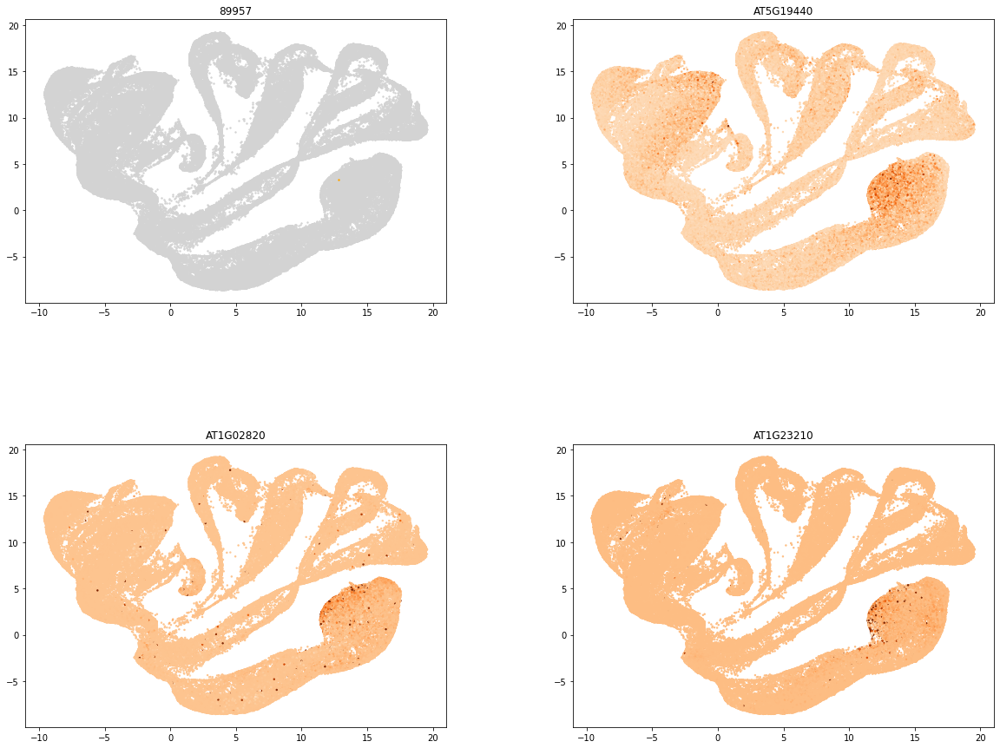

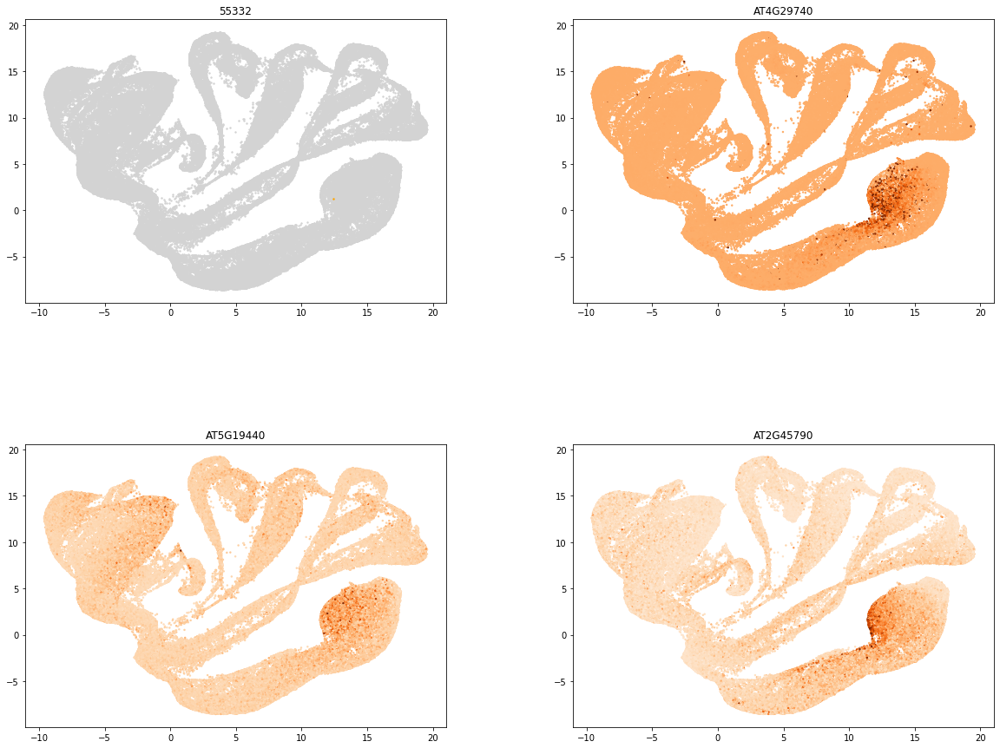

In [34]:
for cell in r_cells:
    top = escores.loc[:, cell].sort_values(ascending=False).index[0:3]

    fig, ((ax1, ax2), (ax3, ax4)) = plt.subplots(2, 2)
    fig.subplots_adjust(wspace=0.3, hspace=0.5)
    fig.set_figheight(15)
    fig.set_figwidth(20)
    
    ax1.scatter(UMAP[:, 0], UMAP[:, 1], s=2, color="lightgrey")
    ax1.scatter(UMAP[int(cell), 0], UMAP[int(cell), 1],
                s=2, color="orange")
    ax1.set_title(cell)
    
    for t, ax in zip(top, [ax2, ax3, ax4]):
        ti = list(hvg_names).index(t)
        ax.scatter(UMAP[:, 0], UMAP[:, 1], s=2,
                   c=HVG[:, ti].data, cmap="Oranges")
        ax.set_title(t)
    plt.show()
    print("\n")